In [1]:
import torch
from PIL import Image
from diffusers import StableDiffusionImg2ImgPipeline
from transformers import CLIPProcessor, CLIPModel
import matplotlib.pyplot as plt

In [2]:
# Define the model and device
model_id = "CompVis/stable-diffusion-v1-4"  # or another suitable model
device = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
# Load the Stable Diffusion image-to-image pipeline
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [4]:
# Load and preprocess the input image
def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    return image

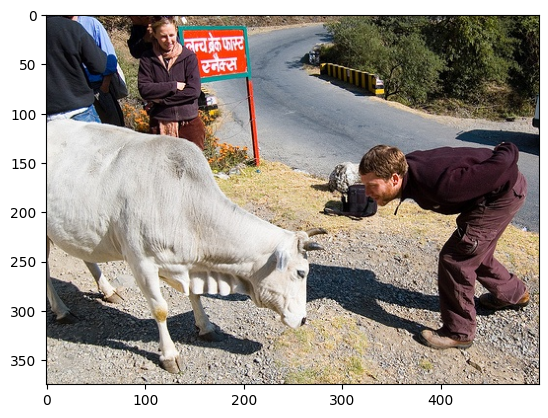

In [5]:
# Load the image
input_image_path = "assets/spair/images/2007_005797.jpg"  # Replace with your image path
input_image = preprocess_image(input_image_path)
plt.imshow(input_image)

In [6]:
# Define the prompt to guide the transformation
prompt = "a person and a dog is running in the field"  # Replace with your desired description

In [7]:
# Set parameters
num_inference_steps = 50  # Number of denoising steps
guidance_scale = 7.5  # Higher values make the generation more influenced by the prompt
strength = 0.8  # How much to transform the input image (0.0 = no change, 1.0 = fully guided by noise)

In [8]:
# Run the image-to-image generation
with torch.autocast("cuda"):
    generated_image = pipe(
        prompt=prompt,
        image=input_image,  # Corrected argument name
        strength=strength,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps
    ).images[0]

c:\Users\saqib\miniconda3\envs\pytorch_env\lib\site-packages\transformers\models\clip\modeling_clip.py:491: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


  0%|          | 0/40 [00:00<?, ?it/s]

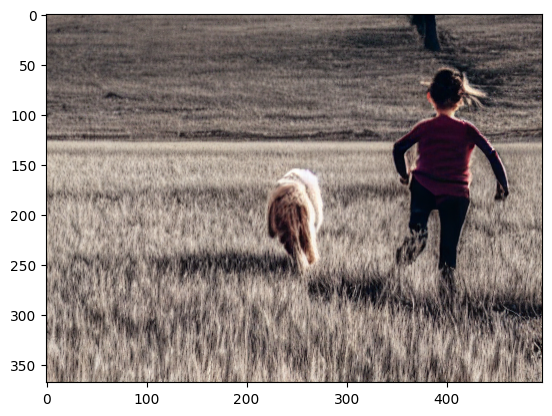

In [9]:
# Save or display the generated image
generated_image.save("output_image.png")
#generated_image.show()
plt.imshow(generated_image)

Simple resnet feature extraction

In [10]:
import torchvision.transforms as transforms

# Preprocessing the image
preprocess = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [11]:
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)

In [12]:
import torchvision.models as models
model = models.resnet50(pretrained=True)  # Replace with your model
model.eval()

# Dictionary to store features
features = {}

# Define the function to create hooks
def get_features(name):
    def hook(model, input, output):
        features[name] = output.detach()
    return hook

# Attach hooks to specific layers (replace with your model's layer names)
model.layer4.register_forward_hook(get_features('layer4'))
model.layer10 = model.layer4[-1]  # Replace this with actual Layer 10 for your model
model.layer10.register_forward_hook(get_features('layer10'))

c:\Users\saqib\miniconda3\envs\pytorch_env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\saqib\miniconda3\envs\pytorch_env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [13]:
# Attach hooks to specific layers (replace with your model's layer names)
model.layer4.register_forward_hook(get_features('layer6'))

# If you're using ResNet-50, there's no layer named "layer10." Instead, let's assume you want a deeper layer.
# You can adjust this based on your specific requirements. In this example, let's use "avgpool" as a representative deep layer.
model.avgpool.register_forward_hook(get_features('avgpool'))

In [14]:
# Forward pass through the model
with torch.no_grad():
    model(input_batch)


In [15]:
# Visualizing the extracted features
def show_feature_map(feature_map, title):
    feature_map = feature_map.squeeze(0)  # remove the batch dimension
    fig, axs = plt.subplots(1, min(feature_map.size(0), 8), figsize=(15, 15))
    fig.suptitle(title, fontsize=16)
    for i in range(min(feature_map.size(0), 8)):  # Visualize a few channels
        axs[i].imshow(feature_map[i].cpu(), cmap='viridis')
        axs[i].axis('off')
    plt.show()

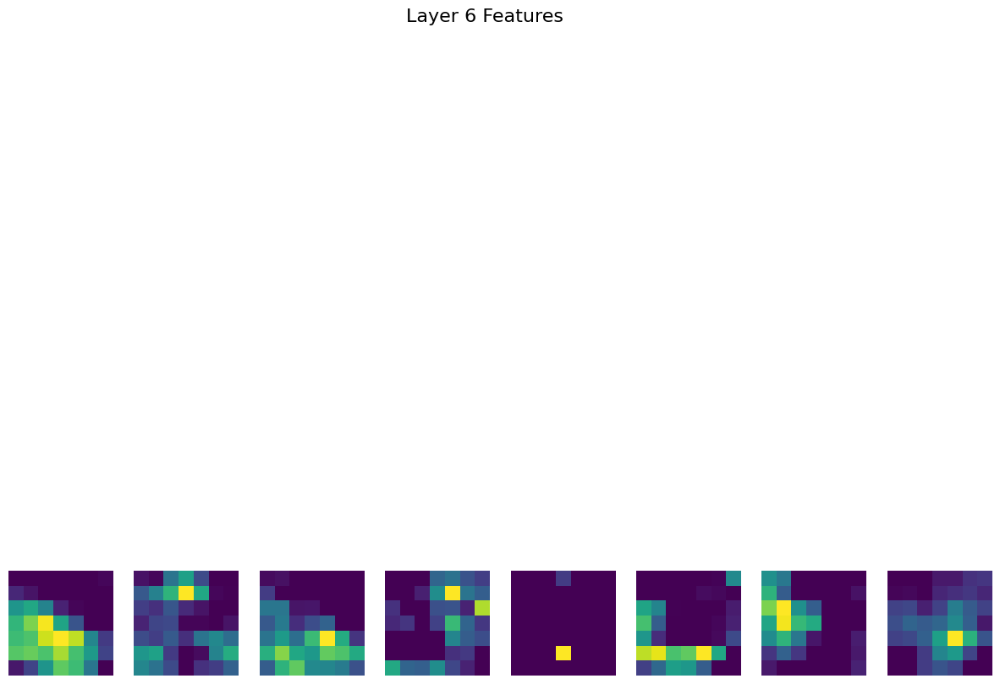

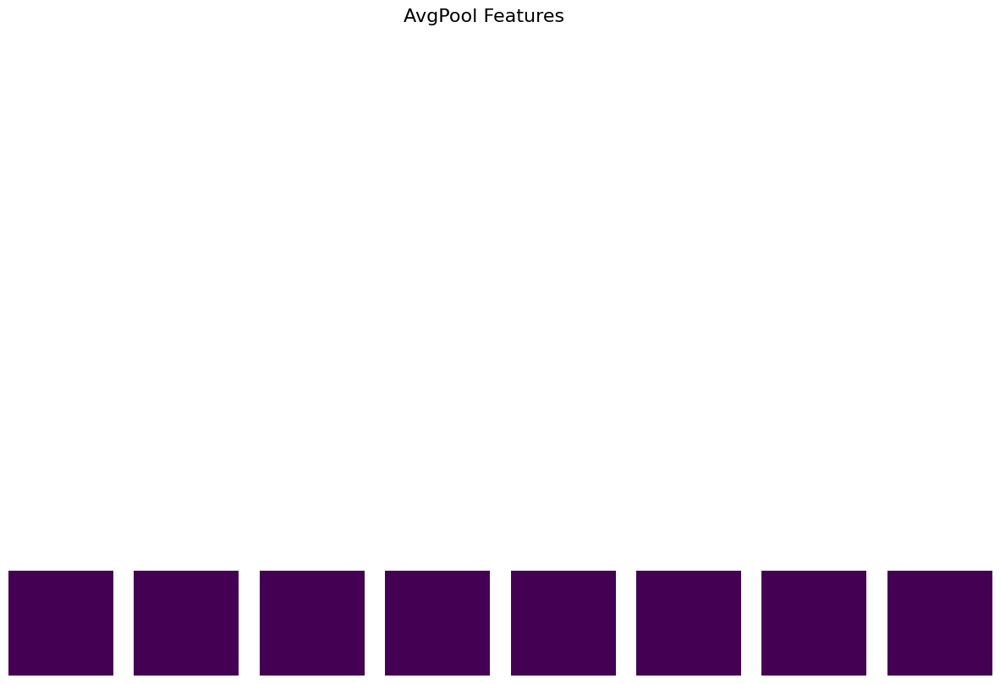

In [16]:
# Display features from the registered layers
show_feature_map(features['layer4'], "Layer 6 Features")
show_feature_map(features['avgpool'], "AvgPool Features")  # Use avgpool as a representative for deeper layers

Feature extraction in diffusion

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [18]:
class FeatureExtractor:
    def __init__(self, model, layers):
        self.model = model
        self.layers = layers
        self.features = {layer: [] for layer in layers}
        self.hooks = []
        self.register_hooks()

    def register_hooks(self):
        for layer_name in self.layers:
            layer = dict([*self.model.named_modules()])[layer_name]
            hook = layer.register_forward_hook(self.get_hook(layer_name))
            self.hooks.append(hook)

    def get_hook(self, layer_name):
        def hook(model, input, output):
            if isinstance(output, tuple):
                output = output[0]
            self.features[layer_name].append(output.detach())
        return hook

    def clear_features(self):
        self.features = {layer: [] for layer in self.layers}

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()

In [19]:
from diffusers import StableDiffusionPipeline

# Load the stable diffusion pipeline, which includes UNet, VAE, and tokenizer
pipeline = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4")
model = pipeline.unet  # Access the UNet model directly
model.to(device)
model.eval()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

In [20]:
for name, module in model.named_modules():
    print(name)


conv_in
time_proj
time_embedding
time_embedding.linear_1
time_embedding.act
time_embedding.linear_2
down_blocks
down_blocks.0
down_blocks.0.attentions
down_blocks.0.attentions.0
down_blocks.0.attentions.0.norm
down_blocks.0.attentions.0.proj_in
down_blocks.0.attentions.0.transformer_blocks
down_blocks.0.attentions.0.transformer_blocks.0
down_blocks.0.attentions.0.transformer_blocks.0.norm1
down_blocks.0.attentions.0.transformer_blocks.0.attn1
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_q
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_k
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_v
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.0
down_blocks.0.attentions.0.transformer_blocks.0.attn1.to_out.1
down_blocks.0.attentions.0.transformer_blocks.0.norm2
down_blocks.0.attentions.0.transformer_blocks.0.attn2
down_blocks.0.attentions.0.transformer_blocks.0.attn2.to_q
down_blocks.0.attenti

In [22]:
layers_to_extract = [
    'conv_in',  # Initial low-level features
    'down_blocks.0',  # Features from the first downsample block
    'down_blocks.0.attentions.0',
    'down_blocks.0.attentions.0.transformer_blocks.0.attn1',  # Attention layer in the first down block
    #'down_blocks.2',  # Features from a deeper downsample block
    #'down_blocks.2.transformer_blocks.0.attn1',  # Attention layer in a deeper block
    'conv_out'  # Final output features
]
feature_extractor = FeatureExtractor(model, layers_to_extract)
print("Feature Extractor Layers:", layers_to_extract)
print("Feature Extractor Initialized:", feature_extractor)

Feature Extractor Layers: ['conv_in', 'down_blocks.0', 'down_blocks.0.attentions.0', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1', 'conv_out']
Feature Extractor Initialized: <__main__.FeatureExtractor object at 0x0000028E18E46AA0>


In [23]:
from diffusers import DDIMScheduler, DDPMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
import torch

In [24]:
scheduler = DDPMScheduler(num_train_timesteps=1000)

In [25]:
import torch.nn as nn

In [26]:
# Load a tokenizer and text model for encoding
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-base-patch32")
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-base-patch32")

# Define the text prompt
text_prompt = "A cat sitting in a living room"

# Tokenize and encode the prompt
text_inputs = tokenizer(text_prompt, return_tensors="pt")
encoder_hidden_states = text_encoder(text_inputs.input_ids).last_hidden_state
encoder_hidden_states = encoder_hidden_states.to(device)

projector = nn.Linear(encoder_hidden_states.size(-1), 768).to(device)
encoder_hidden_states = projector(encoder_hidden_states)

print(encoder_hidden_states.shape)

torch.Size([1, 9, 768])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-5.392189..4.4421263].


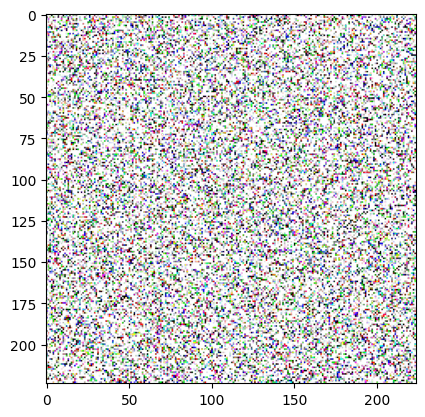

In [27]:
feature_extractor.clear_features()
initial_noise = torch.randn((1, 4, 224, 224), device=device) 
generated_image = initial_noise
plt.imshow(generated_image[0].cpu().numpy().transpose(1, 2, 0))  # Transpose to (H, W, C) for visualization
plt.show()

steps = 50 
scheduler.set_timesteps(steps)

In [28]:
def run_diffusion_steps(model, extractor, initial_noise, steps=50, scheduler=None, encoder_hidden_states=None):
    extractor.clear_features()
    generated_image = initial_noise

    # Set the scheduler timesteps for sampling
    scheduler.set_timesteps(steps)

    # Run the generation process
    for step in scheduler.timesteps:
        with torch.no_grad():
            # Get model output (predicted noise or other output depending on model)
            model_output = model(generated_image, step, encoder_hidden_states=encoder_hidden_states).sample
            print("model output:", model_output.shape)

            # Denoise step using the scheduler
            generated_image = scheduler.step(model_output, step, generated_image).prev_sample
            print("generated:", generated_image.shape)

    return generated_image, extractor.features

In [29]:
# Run for generation steps with the `encoder_hidden_states` parameter
initial_noise = torch.randn((1, 4, 224, 224), device=device)  # Example input for a 224x224 image

generated_image, generation_features = run_diffusion_steps(
    model, feature_extractor, initial_noise, steps=50, scheduler=scheduler, encoder_hidden_states=encoder_hidden_states
)

model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
model output: torch.Size([1, 4, 224, 224])
generated: torch.Size([1, 4, 224, 224])
mode

In [35]:
print("Keys in generation_features:", generation_features.keys())
for key, value in generation_features.items():
    if isinstance(value, torch.Tensor):
        print(f"Key: {key}, Shape: {value.shape}")
    elif isinstance(value, list):
        print(f"Key: {key} is a list with length {len(value)}")
    else:
        print(f"Key: {key} is of type {type(value)}")

Keys in generation_features: dict_keys(['conv_in', 'down_blocks.0', 'down_blocks.0.attentions.0', 'down_blocks.0.attentions.0.transformer_blocks.0.attn1', 'conv_out'])
Key: conv_in is a list with length 50
Key: down_blocks.0 is a list with length 50
Key: down_blocks.0.attentions.0 is a list with length 50
Key: down_blocks.0.attentions.0.transformer_blocks.0.attn1 is a list with length 50
Key: conv_out is a list with length 50


In [41]:
def plot_features(features, num_images=6):
    """
    Plot feature maps.
    
    Parameters:
        features (torch.Tensor): The generated feature tensor of shape (1, num_channels, height, width).
        num_images (int): Number of channels to display (for visualization).
    """
    features = features.detach().cpu()  # Move to CPU and detach from computation graph if necessary
    num_channels = features.shape[1]

    # Plot a few feature maps (up to `num_images`)
    fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
    for i in range(num_images):
        if i >= num_channels:
            break  # If num_images is greater than available channels, stop plotting
        # Select the feature map for the ith channel
        feature_map = features[0, i, :, :]
        axs[i].imshow(feature_map, cmap="viridis")
        axs[i].axis("off")
        axs[i].set_title(f"Channel {i+1}")
    plt.show()


In [38]:
def plot_features_from_list(features_list, num_images=6):
    """
    Plot feature maps from a list of tensors.
    
    Parameters:
        features_list (list): A list of torch.Tensor objects representing feature maps.
        num_images (int): Number of channels to display per feature map (for visualization).
    """
    for i, features in enumerate(features_list):
        print(f"Plotting features from list item {i + 1}/{len(features_list)}")
        features = features.detach().cpu()  # Move to CPU and detach
        num_channels = features.shape[0]
        
        # Plot a few feature maps (up to `num_images`)
        fig, axs = plt.subplots(1, num_images, figsize=(15, 5))
        for j in range(min(num_images, num_channels)):
            feature_map = features[j, :, :]
            axs[j].imshow(feature_map, cmap="viridis")
            axs[j].axis("off")
            axs[j].set_title(f"Channel {j + 1}")
        plt.show()

In [8]:
import os
import torch
import matplotlib.pyplot as plt

In [1]:
folder_path = 'hyperfeatures/'

In [2]:
# Function to plot hyperfeatures
def plot_hyperfeatures(file_path):
    # Load the .pt file
    features = torch.load(file_path)

    # Assuming the features are in a tensor format [C, H, W]
    # Where C is the number of channels (hyperfeatures), H and W are height and width
    if len(features.shape) == 3:
        C, H, W = features.shape
        n_cols = 8  # Adjust this for the number of plots per row
        n_rows = (C + n_cols - 1) // n_cols

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
        axes = axes.flatten()

        for i in range(C):
            ax = axes[i]
            ax.imshow(features[i].cpu().numpy(), cmap='viridis')  # Use an appropriate colormap
            ax.axis('off')
            ax.set_title(f'Feature {i+1}')

        # Hide unused subplots if any
        for j in range(i + 1, len(axes)):
            axes[j].axis('off')

        plt.suptitle(f'Hyperfeatures from {os.path.basename(file_path)}')
        plt.show()
    else:
        print("Unexpected feature shape:", features.shape)

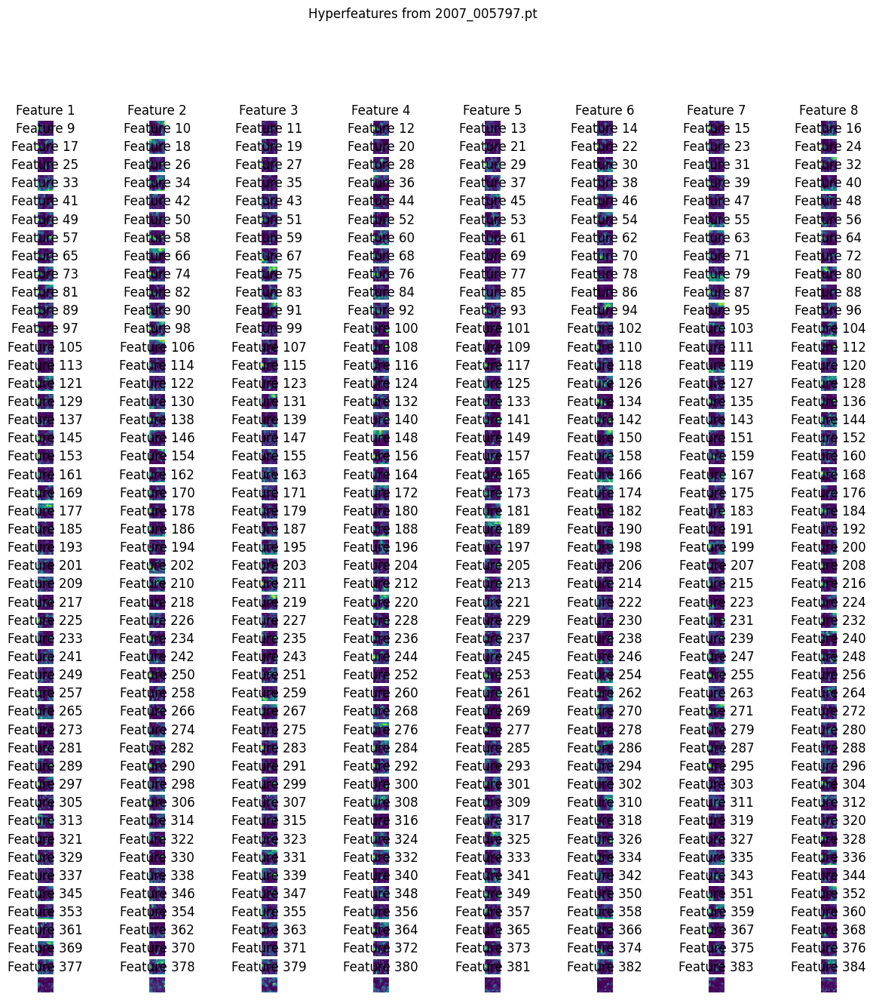

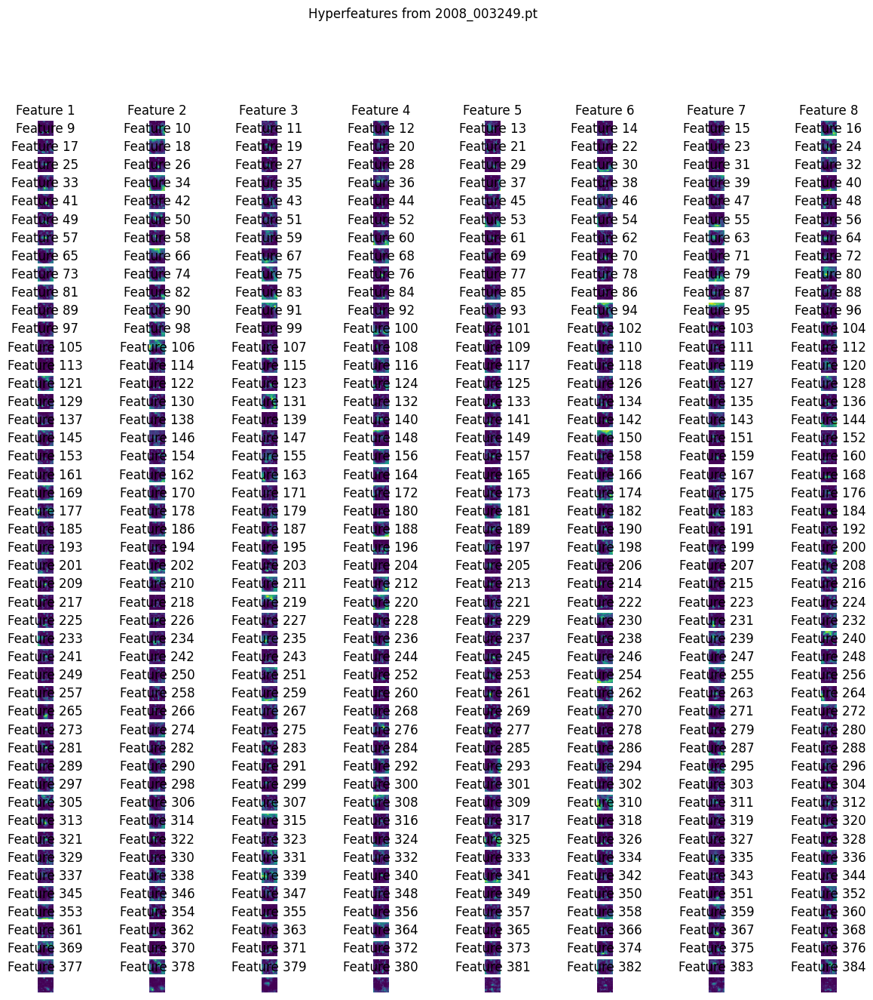

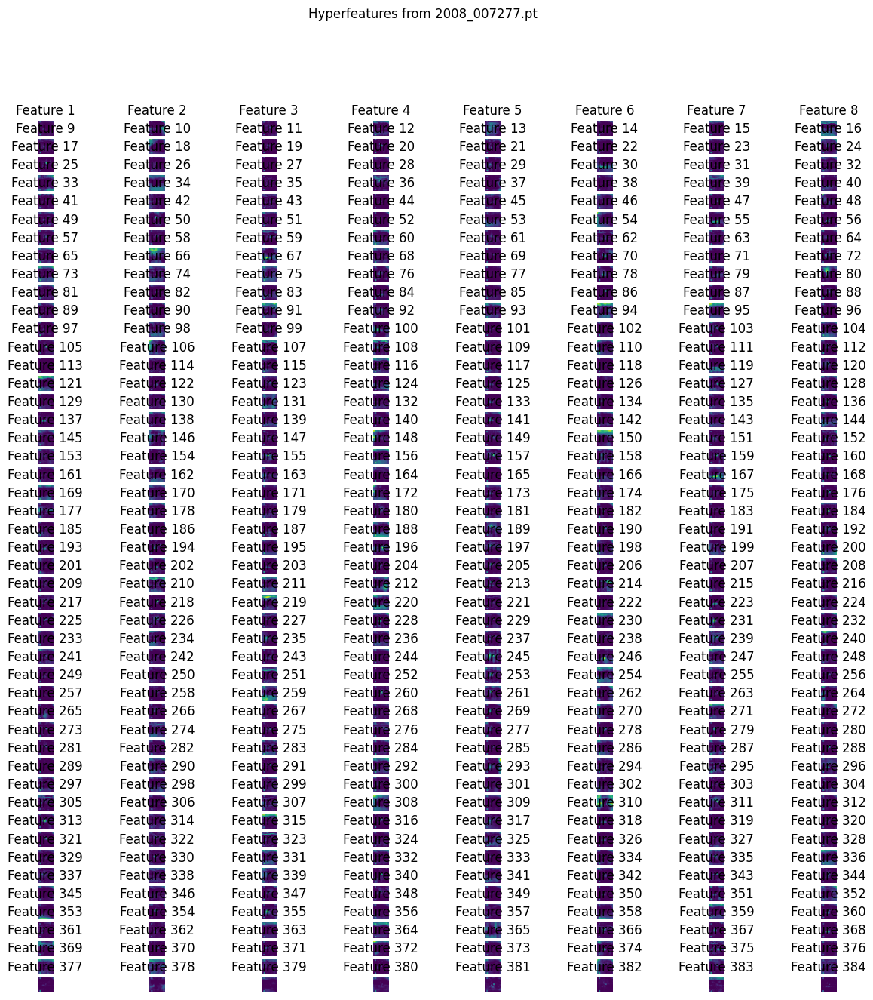

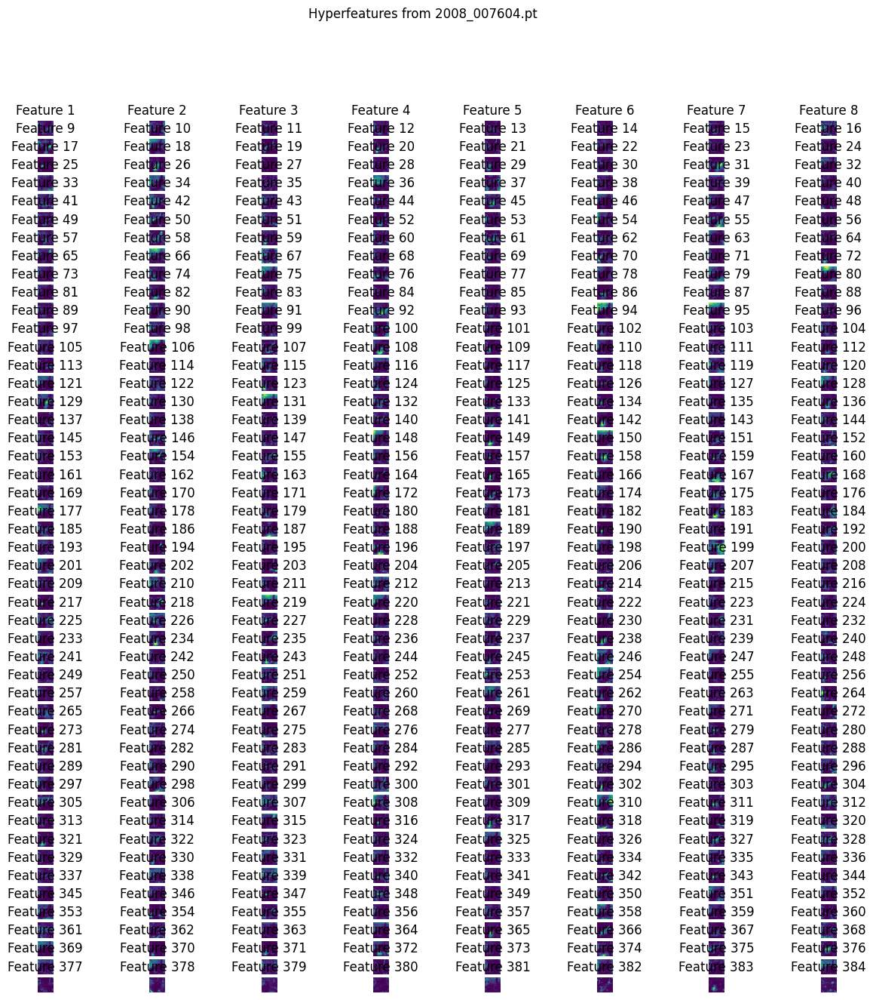

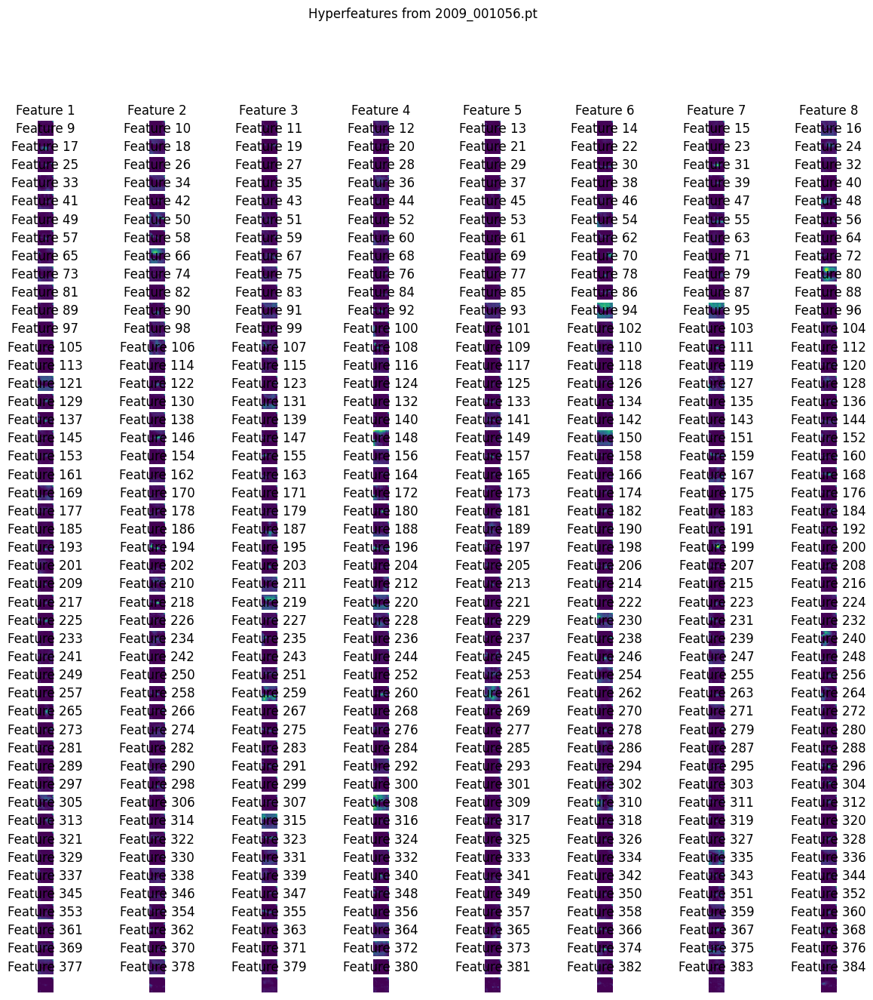

...

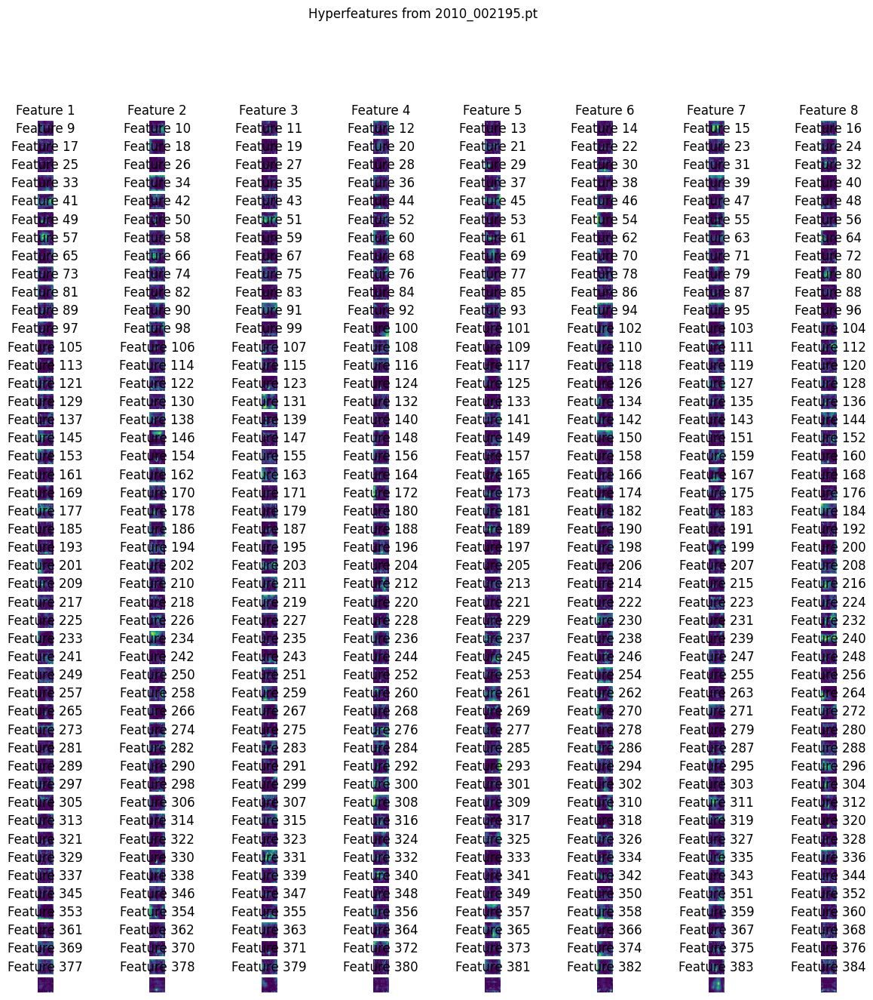

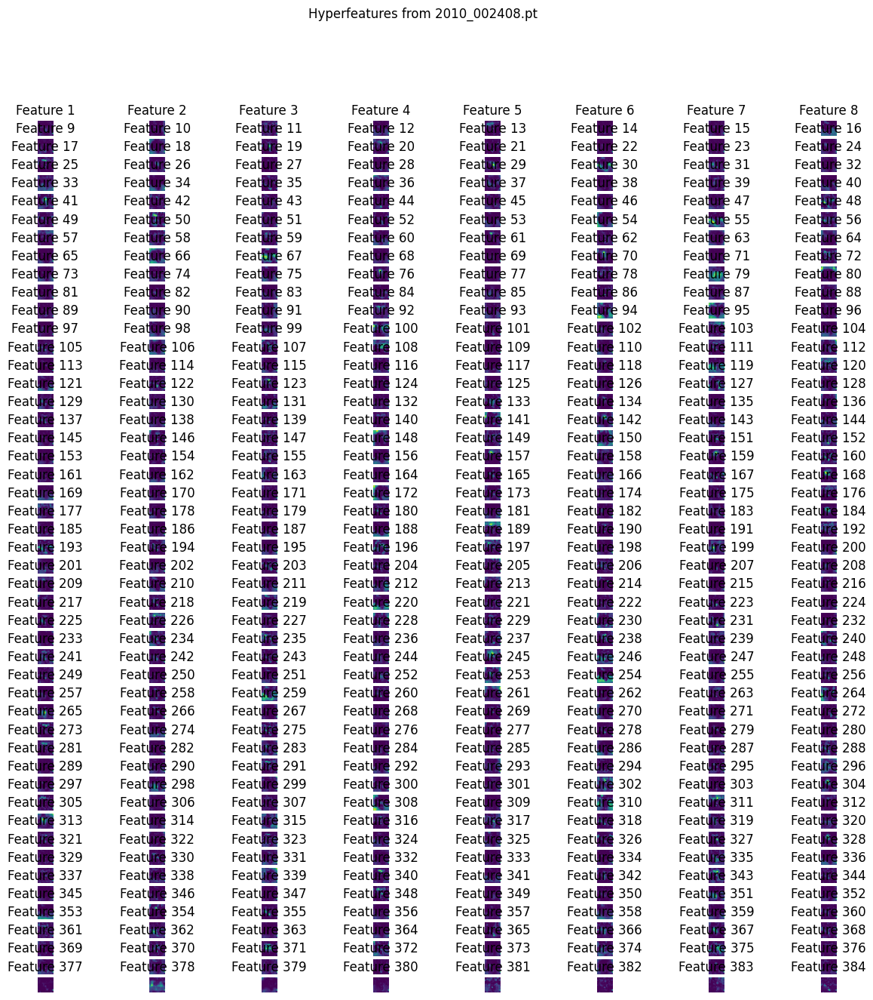

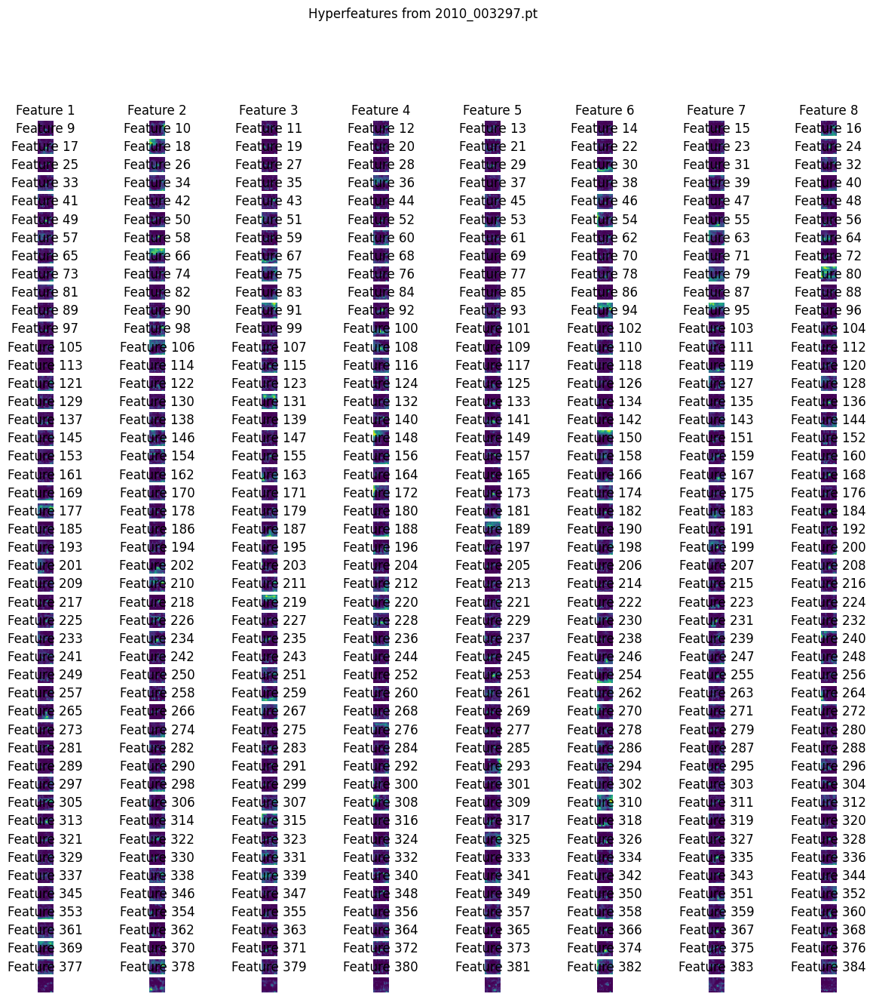

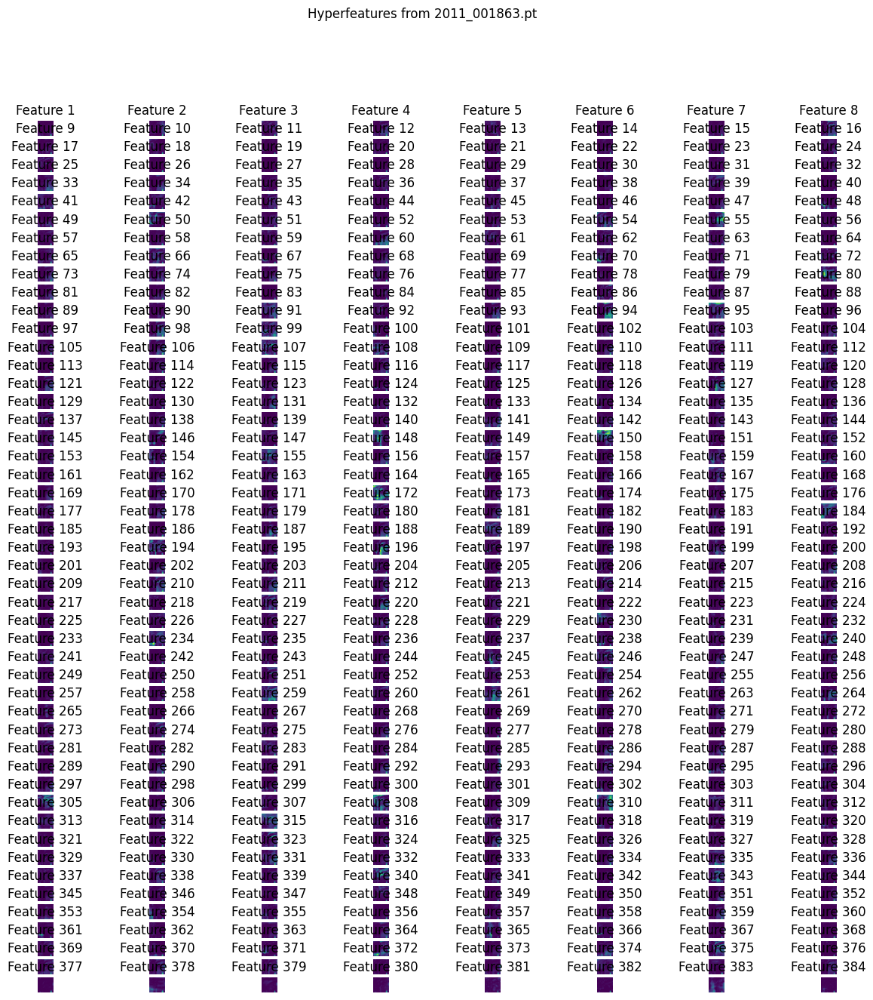

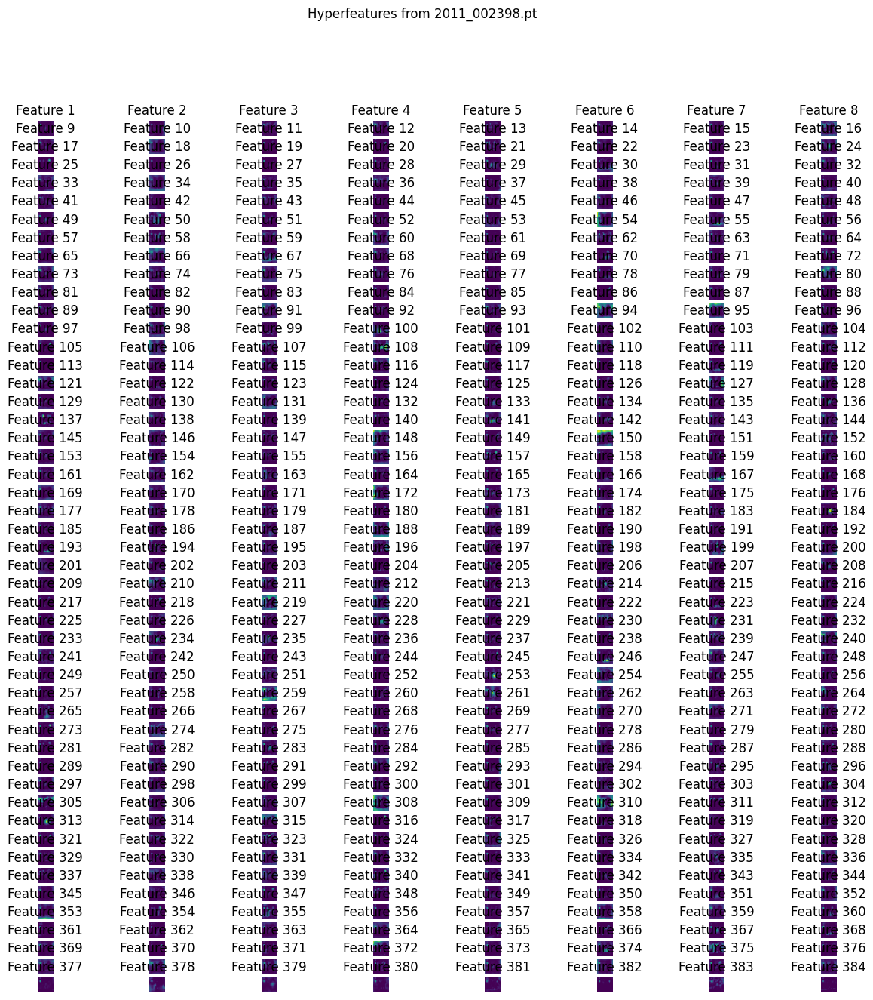

In [9]:
for filename in os.listdir(folder_path):
    if filename.endswith('.pt'):
        file_path = os.path.join(folder_path, filename)
        plot_hyperfeatures(file_path)

In [17]:
folder_path = 'hyperfeatures/'

all_features = []

for filename in os.listdir(folder_path):
    if filename.endswith('.pt'):
        file_path = os.path.join(folder_path, filename)
        features = torch.load(file_path)  # Load the features
        all_features.append(features)

In [18]:
concatenated_features = torch.cat(all_features, dim=0)

In [19]:
average_feature_map = concatenated_features.mean(dim=0)

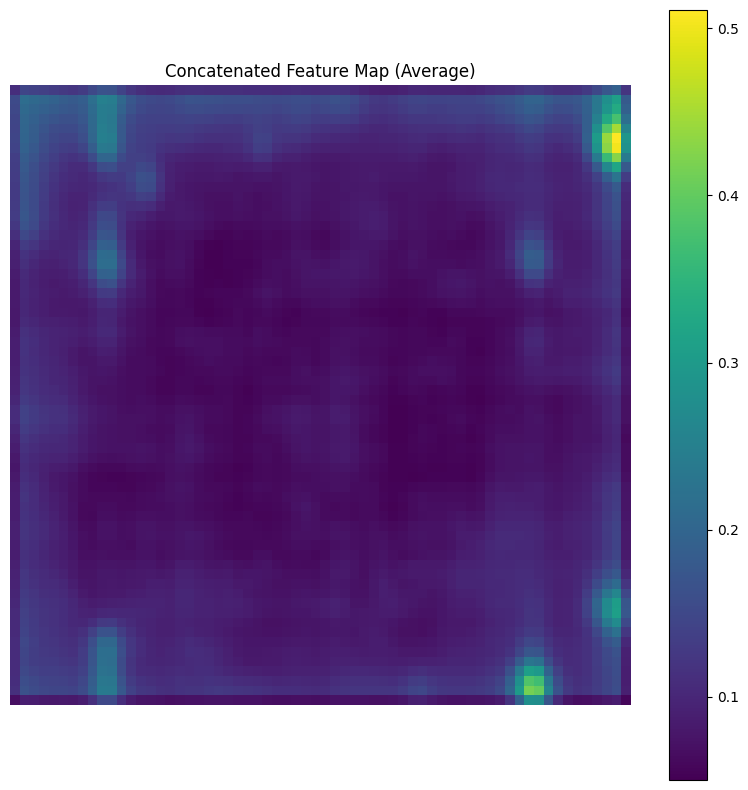

In [20]:
plt.figure(figsize=(10, 10))
plt.imshow(average_feature_map.cpu().numpy(), cmap='viridis')
plt.colorbar()
plt.title("Concatenated Feature Map (Average)")
plt.axis('off')
plt.show()

In [24]:
file_path = 'hyperfeatures/2011_002398.pt'
features = torch.load(file_path)  # Assuming the tensor shape is [C, H, W]

In [25]:
average_feature_map = features.mean(dim=0)

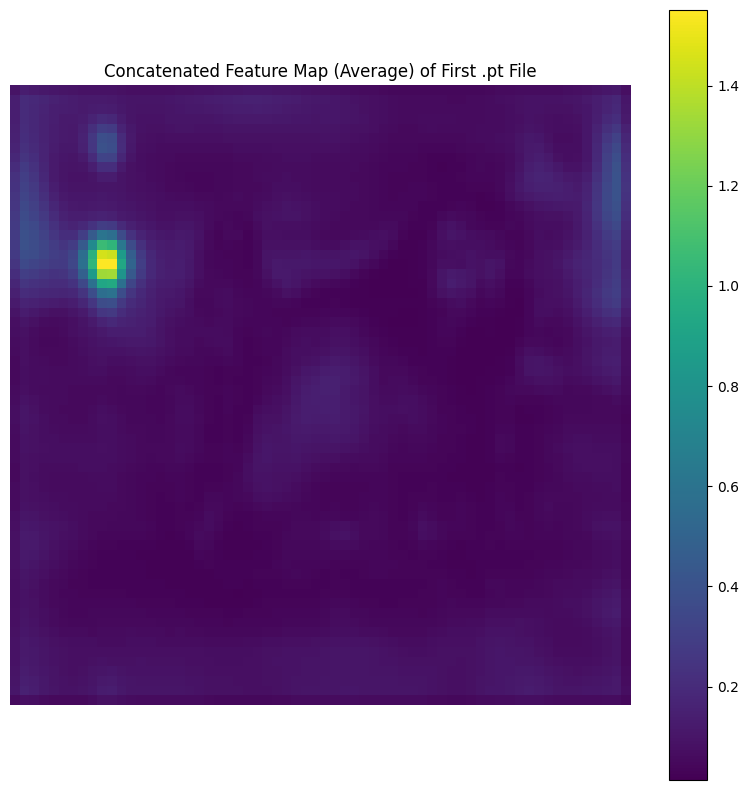

In [26]:
plt.figure(figsize=(10, 10))
plt.imshow(average_feature_map.cpu().numpy(), cmap='viridis')
plt.colorbar()
plt.title("Concatenated Feature Map (Average) of First .pt File")
plt.axis('off')
plt.show()